# BAB I. PERKENALAN


## =================================================

## Graded Challenge 7

## Nama  : Ranie Sita Mannuela
## Batch : RMT-030

### Objective:
#### Tujuan dari program ini adalah untuk mengembangkan model computer vision menggunakan Arrtificial Neural Networks(ANN) untuk mengklasifikasikan gambar kanker kulit. Model ini diharapkan dapat membedakan berbagai jenis lesi kulit dengan akurasi yang baik. Proses melibatkan beberapa tahap penting, termasuk pemuatan dan pra-pemrosesan data, analisis data eksploratif, rekayasa fitur (seperti augmentasi data), serta pelatihan dan evaluasi model ANN
## =================================================

# BAB II. IMPORT LIBRARIES

In [ ]:
# Import libraries

import zipfile
import os
import glob
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import tensorflow as tf
from pathlib import Path
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.model_selection import train_test_split
from tensorflow.keras.models import Model, Sequential
from tensorflow.keras.layers import Dense, Dropout, Conv2D, MaxPooling2D, Flatten, Dropout, Input
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
from sklearn.metrics import classification_report
from tensorflow.keras.applications import VGG16, ResNet50
from tensorflow.keras.metrics import Precision, Recall
from tensorflow.keras.regularizers import l2




# BAB III. DATA LOADING

In [ ]:
from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


In [ ]:
!cp "/content/drive/My Drive/Hacktiv8/skin_cancer.zip" /content/


In [ ]:
zip_file_path = '/content/drive/My Drive/Hacktiv8/skin_cancer.zip'
extract_folder_path = '/content/skin_cancer'

if not os.path.exists(extract_folder_path):
  with zipfile.ZipFile(zip_file_path, 'r') as zip_ref:
    zip_ref.extractall(extract_folder_path)

In [ ]:
# Verifikasi isi direktori untuk memastikan file telah diekstrak dengan benar
print(os.listdir(extract_folder_path))

['__MACOSX', 'Skin cancer ISIC The International Skin Imaging Collaboration']

# Tentukan path untuk dataset train dan test
train_path ='/content/skin_cancer/Skin cancer ISIC The International Skin Imaging Collaboration/Train'
test_path ='/content/skin_cancer/Skin cancer ISIC The International Skin Imaging Collaboration/Test'

train_datagen = ImageDataGenerator(rescale=1./255.)
test_datagen = ImageDataGenerator(rescale=1./255.)

train_gen = train_datagen.flow_from_directory(
	train_path,
	target_size=(150,150),
	class_mode='categorical',
  batch_size=126,
	shuffle=False
)
test_gen = test_datagen.flow_from_directory(
	test_path,
	target_size=(150,150),
	class_mode='categorical',
  batch_size=126,
	shuffle=False
)


['Skin cancer ISIC The International Skin Imaging Collaboration', '__MACOSX']
Found 2239 images belonging to 9 classes.
Found 118 images belonging to 9 classes.


In [ ]:
print(train_gen.class_indices)
print(test_gen.class_indices)

{'actinic keratosis': 0, 'basal cell carcinoma': 1, 'dermatofibroma': 2, 'melanoma': 3, 'nevus': 4, 'pigmented benign keratosis': 5, 'seborrheic keratosis': 6, 'squamous cell carcinoma': 7, 'vascular lesion': 8}
{'actinic keratosis': 0, 'basal cell carcinoma': 1, 'dermatofibroma': 2, 'melanoma': 3, 'nevus': 4, 'pigmented benign keratosis': 5, 'seborrheic keratosis': 6, 'squamous cell carcinoma': 7, 'vascular lesion': 8}


In [ ]:
np.random.randint(len(train_gen.next()[0]), size=16)

array([113,  67,  40,  96, 105,  39,  14,  75,  89,  32,   6,  86,  68,
        19,  16,  37])

In [ ]:
# Function to visualize the first 5 images from each class

def plot_images(path):
  labels = os.listdir(path)
  for label in labels:
    folder_path = os.path.join(path, label)
    fig = plt.figure(figsize=(20, 20))
    columns = 5
    rows = 1
    print('Class : ', label)
    images = os.listdir(folder_path)
    num_images_to_display = min(columns * rows, len(images))
    for index in range(num_images_to_display):
        fig.add_subplot(rows, columns, index + 1)
        image = plt.imread(os.path.join(folder_path, images[index]))
        plt.imshow(image)
        plt.axis("off")
    plt.show()

Class :  nevus


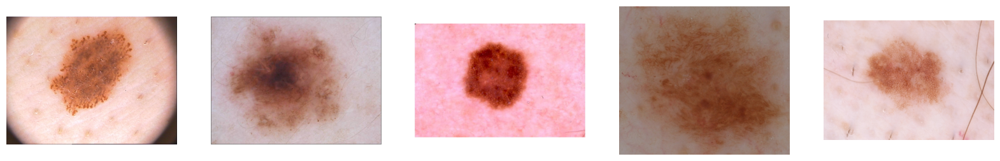

Class :  melanoma


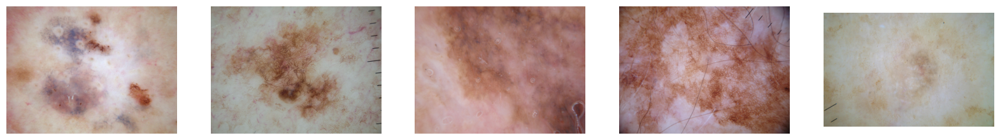

Class :  squamous cell carcinoma


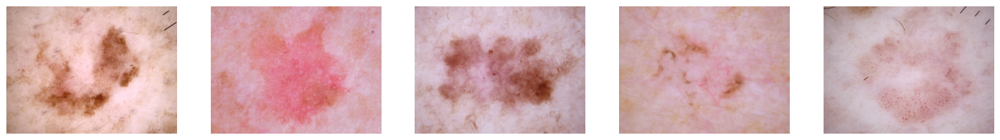

Class :  seborrheic keratosis


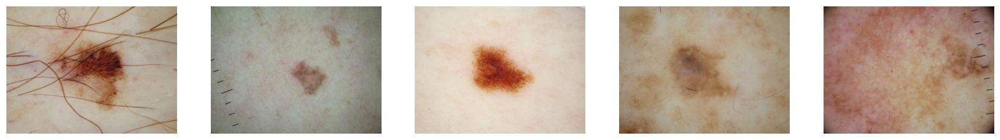

Class :  actinic keratosis


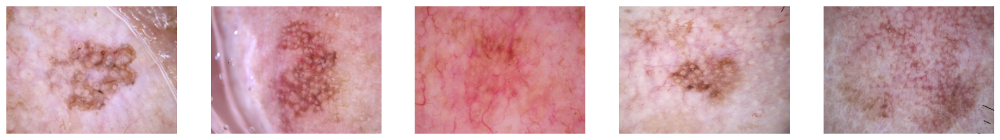

Class :  basal cell carcinoma


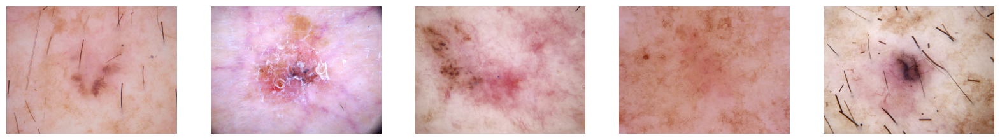

Class :  pigmented benign keratosis


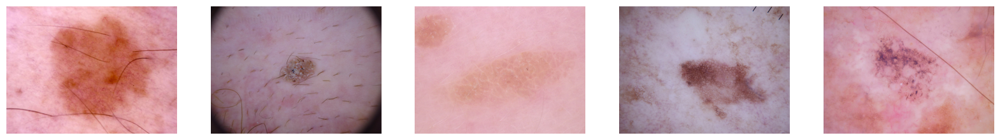

Class :  dermatofibroma


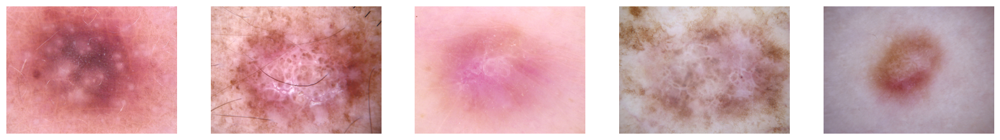

Class :  vascular lesion


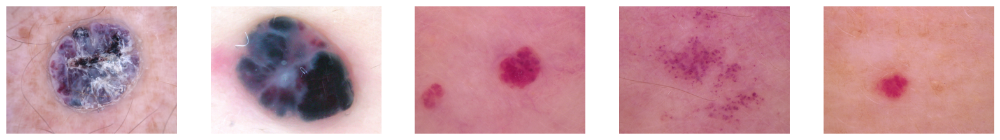

In [ ]:
# Visualization of train_path

plot_images(train_path)

Class :  nevus


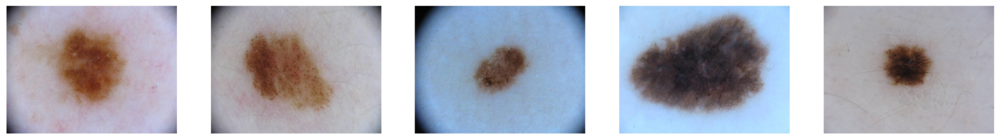

Class :  melanoma


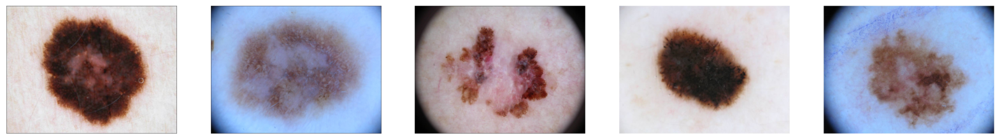

Class :  squamous cell carcinoma


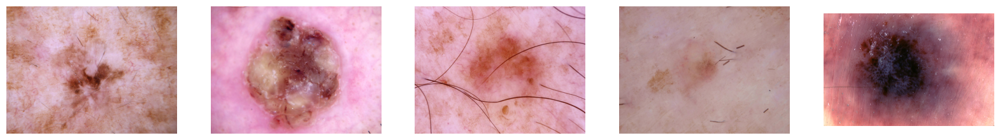

Class :  seborrheic keratosis


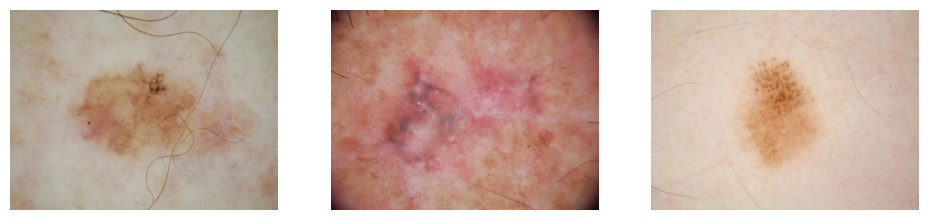

Class :  actinic keratosis


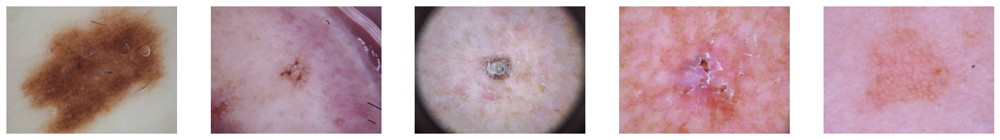

Class :  basal cell carcinoma


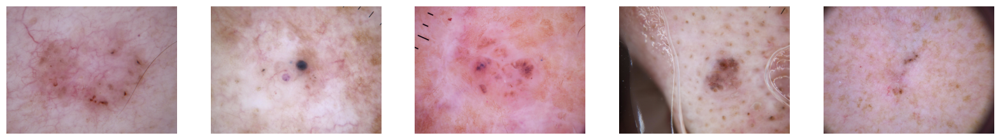

Class :  pigmented benign keratosis


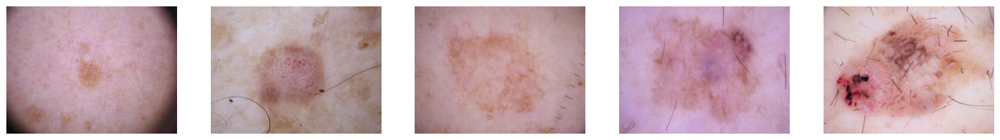

Class :  dermatofibroma


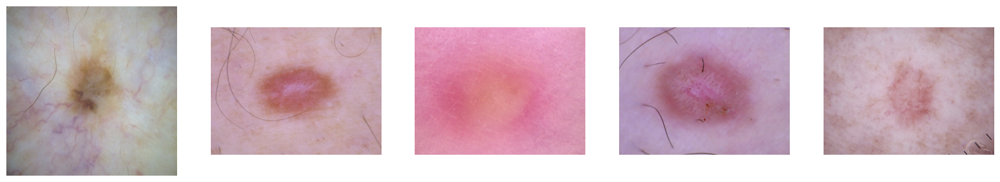

Class :  vascular lesion


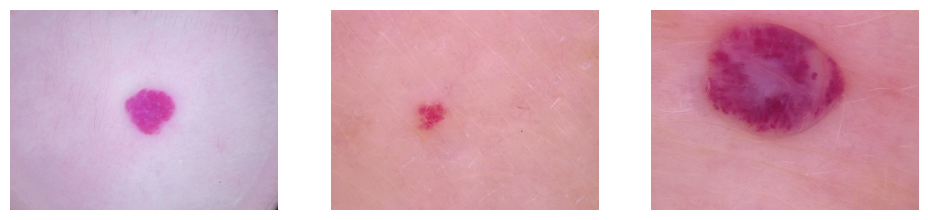

In [ ]:
# Visualization of `test_path`

plot_images(test_path)

# BAB IV. EXPLORATORY DATA ANALYSIS

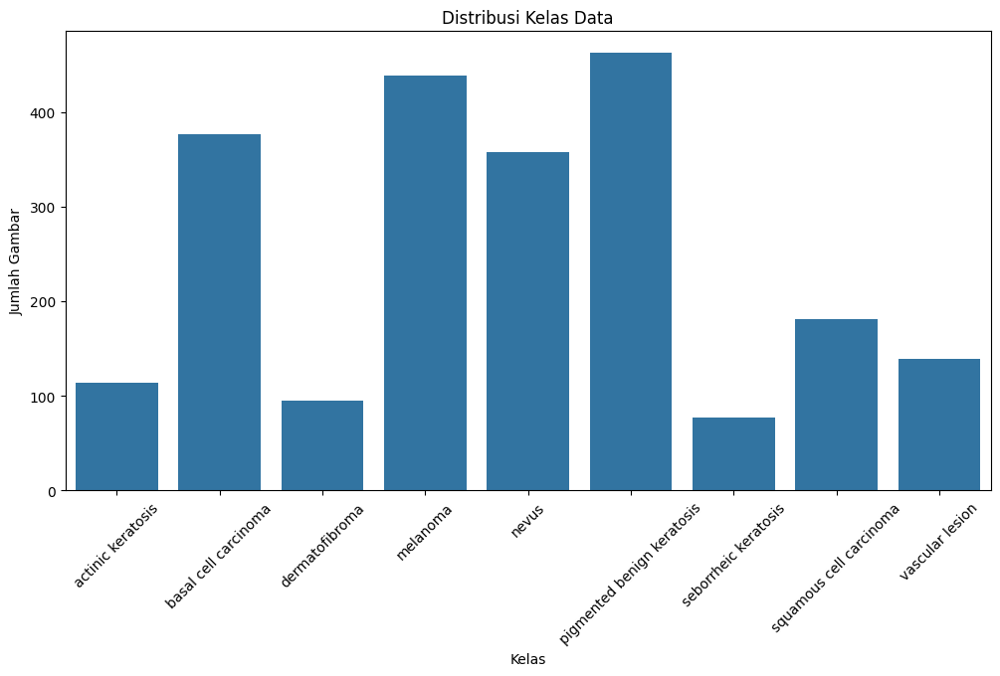

In [ ]:
# Visualiasi distribusi kelas

train_labels = train_gen.classes
class_names = list(train_gen.class_indices.keys())

label_counts = pd.Series(train_labels).value_counts().sort_index()
df = pd.DataFrame({'Class':class_names, 'Count':label_counts})

plt.figure(figsize=(12,6))
sns.barplot(x='Class', y='Count', data=df)
plt.title('Distribusi Kelas Data')
plt.xlabel('Kelas')
plt.ylabel('Jumlah Gambar')
plt.xticks(rotation=45)
plt.show()

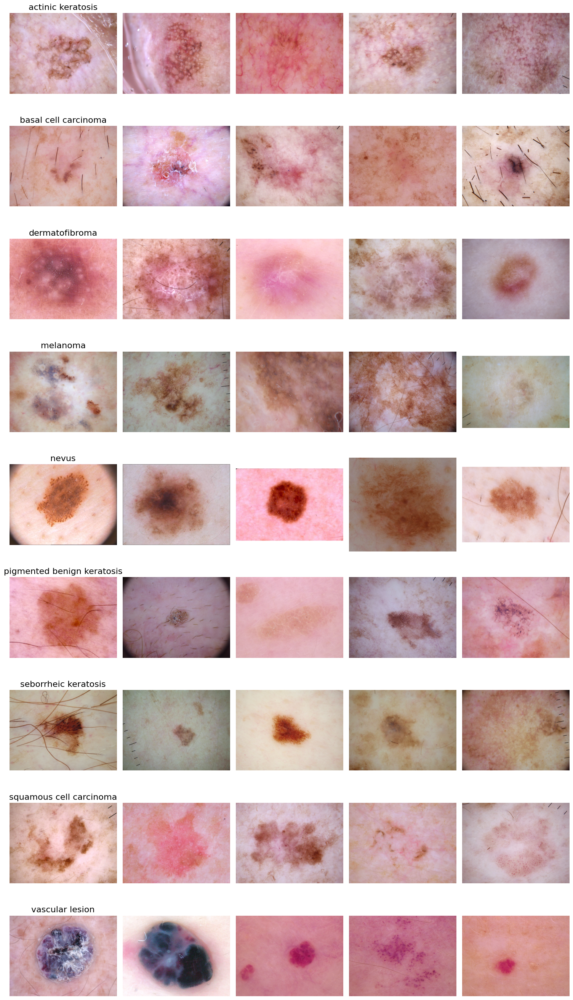

In [ ]:
# Sample images per class

def plot_sample_images(generator, class_names, num_images_per_class=5):
  fig, axes = plt.subplots(len(class_names),num_images_per_class, figsize=(num_images_per_class*3, len(class_names)*3))
  for class_index, class_name in enumerate(class_names):
    class_path = os.path.join(generator.directory, class_name)
    images = os.listdir(class_path)[:num_images_per_class]
    for img_index, img_name in enumerate(images):
      img_path = os.path.join(class_path, img_name)
      img = plt.imread(img_path)
      axes[class_index, img_index].imshow(img)
      axes[class_index, img_index].axis('off')
      if img_index == 0:
        axes[class_index, img_index].set_title(class_name, fontsize=16)
  plt.tight_layout()
  plt.show()

plot_sample_images(train_gen, class_names)

##### 1. Distribusi Kelas Data:
###### - Kelas 'melanoma' dan 'pigmented benign kerastosis' memiliki jumlah gambar terbanyak, masing-masing lebih dari 400 gambar.
###### - Kelas 'actinic kerastosis','dermatofibroma', dan 'seborrheic kerastosis' memiliki jumlah gambar yang relatif sedikit, kurang dari 150 gambar.
##### 2. Visualisasi gambar per kelas:
###### - Kelas 'actinic kerastosis' menampilkan gambar dengan lesi yang lebih cerah dan tidak merata
###### - Kelas 'basal cell carcinoma' memiliki gambar dengan lesi yang lebih gelap dan jelas terlihat
###### - Kelas 'melanoma' menampilkan gambar dengan lesi berpigmen lebih gelap dan terkadang berbentuk tidak teratur

# BAB V. FEATURE ENGINEERING

### -  Data Augmentation

In [ ]:
train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest',
    validation_split=0.2
)
test_val_datagen = ImageDataGenerator(rescale=1./255)

In [ ]:
test_val_datagen

### - Split Data menjadi Train, Test dan Validation Sets

In [ ]:
train_path ='/content/skin_cancer/Skin cancer ISIC The International Skin Imaging Collaboration/Train'
test_path ='/content/skin_cancer/Skin cancer ISIC The International Skin Imaging Collaboration/Test'

train_gen = train_datagen.flow_from_directory(
    train_path,
    target_size=(150,150),
    batch_size=32,
    class_mode='categorical',
    subset='training',
    shuffle=True
)

val_gen = train_datagen.flow_from_directory(
    train_path,
    target_size=(150,150),
    batch_size=32,
    class_mode='categorical',
    subset='validation',
    shuffle=True
)

test_gen = test_val_datagen.flow_from_directory(
    train_path,
    target_size=(150,150),
    batch_size=32,
    class_mode='categorical',
    shuffle=False
)

Found 1795 images belonging to 9 classes.
Found 444 images belonging to 9 classes.
Found 2239 images belonging to 9 classes.


### -Visualize Augmented Data


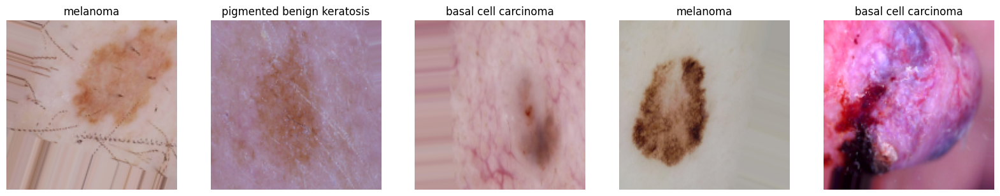

In [ ]:
def plot_augmented_images(generator, class_names, num_images=5):
  x, y = next(generator)
  fig, axes = plt.subplots(1, num_images, figsize=(20,20))
  for i in range(num_images):
    axes[i].imshow(x[i])
    axes[i].axis('off')
    axes[i].set_title(class_names[np.argmax(y[i])])
  plt.show()

plot_augmented_images(train_gen, list(train_gen.class_indices.keys()))

#### 1. Augmentasi Data : digunakan untuk membuat variasi baru dari gambar yang ada, yang dapat membantu meningkatkan kemampuan dalam generalisasi model. Dengan rotasi, pergeseran, zoom, dan flip, model dapat belajar untuk mengenali objek meskipun dengan variasi berbeda.

#### 2. Rescaling : gambar di-rescale ke rentang 0-1 untuk memastikan bahwa nilai pixel berada dalam rentang konsisten, yang dapat membantu dalam konvergensi model selama train.

#### 3. Pembagian dataset : dataset dibagi menjadi train, validation, dan test untuk memastikan bahwa model dapat diuji dan divalidasi dengan data yang tidak dilihat selama training. Hal tersebut dapat membantu dalam mengevaluasi kinerja model menjadi lebih akurat dan menceegah overfitting.

# BAB VI. ANN TRAINING (SEQUENTIAL API)

## 4.1 Tanpa Data Augmentation

#### -Preprocessing

In [ ]:
# Define hyperparameters

img_height= 150
img_width= 150
batch_size= 32

In [ ]:
# Create batch generator for train-set, val-set, and test-set without augmentation
from tensorflow.keras.preprocessing.image import ImageDataGenerator

train_datagen = ImageDataGenerator(rescale=1./255, validation_split=0.2)

train_set = train_datagen.flow_from_directory(train_path,
                                              target_size=(img_height,img_width),
                                              class_mode='categorical',
                                              subset='training',
                                              batch_size=batch_size,
                                              shuffle=True)

val_set = train_datagen.flow_from_directory(train_path,
                                            target_size=(img_height,img_width),
                                            class_mode='categorical',
                                            subset='validation',
                                            batch_size=batch_size,
                                            shuffle=True)

test_datagen = ImageDataGenerator(rescale=1./255)

test_set = test_datagen.flow_from_directory(test_path,
                                            target_size=(img_height,img_width),
                                            class_mode='categorical',
                                            batch_size=batch_size,
                                            shuffle=False)

Found 1795 images belonging to 9 classes.
Found 444 images belonging to 9 classes.
Found 118 images belonging to 9 classes.


In [ ]:
# Show labels

train_set.class_indices

{'actinic keratosis': 0,
 'basal cell carcinoma': 1,
 'dermatofibroma': 2,
 'melanoma': 3,
 'nevus': 4,
 'pigmented benign keratosis': 5,
 'seborrheic keratosis': 6,
 'squamous cell carcinoma': 7,
 'vascular lesion': 8}

### -Model Definition



In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Conv2D, MaxPooling2D, Flatten, Dropout
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping

In [ ]:
# Clear session

tf.keras.backend.clear_session()
np.random.seed(20)
tf.random.set_seed(20)

In [ ]:
# Create Sequential API model
model = Sequential()

model.add(Conv2D(32, (3,3), activation='relu', input_shape=(img_height,img_width, 3)))
model.add(MaxPooling2D(pool_size=(2,2)))

model.add(Conv2D(64, (3,3), activation='relu'))
model.add(MaxPooling2D(pool_size=(2,2)))

model.add(Conv2D(128, (3,3), activation='relu'))
model.add(MaxPooling2D(pool_size=(2,2)))

model.add(Flatten())

model.add(Dense(512, activation='relu'))
model.add(Dropout(0,5))

model.add(Dense(9, activation='softmax'))

model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

In [ ]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 148, 148, 32)      896       
                                                                 
 max_pooling2d (MaxPooling2  (None, 74, 74, 32)        0         
 D)                                                              
                                                                 
 conv2d_1 (Conv2D)           (None, 72, 72, 64)        18496     
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 36, 36, 64)        0         
 g2D)                                                            
                                                                 
 conv2d_2 (Conv2D)           (None, 34, 34, 128)       73856     
                                                                 
 max_pooling2d_2 (MaxPoolin  (None, 17, 17, 128)       0

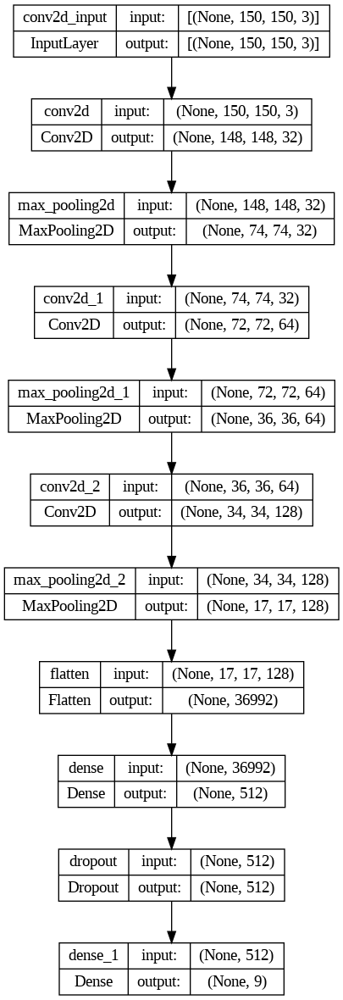

In [ ]:
# Plot layers

tf.keras.utils.plot_model(model, show_shapes=True)

#### - Dengan total 19038281 parameter, model ini cukup kompleks dan memiliki kemampuan yang baik untuk menangkap pola dalam dataset yang besar
#### - Kombinasi layer yang konvolusi dan pooling diikuti oleh fully connected memberikan kemampuan yang baik untuk ekstraksi fitur dan klasifikasi
#### - Dropout dengan rate 0.5 merupakan pilihan yang bbaik untuk mencegah overfitting, terutama pada layer fullyy connected yang memiliki banyak parameter.

### -Model Training


In [ ]:
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

history = model.fit(
    train_set,
    epochs=25,
    validation_data=val_set,
    callbacks=[early_stopping]
)

Epoch 1/25
57/57 [==============================] - 133s 2s/step - loss: 2.0910 - accuracy: 0.2702 - val_loss: 1.8482 - val_accuracy: 0.2905
Epoch 2/25
57/57 [==============================] - 131s 2s/step - loss: 1.6884 - accuracy: 0.3978 - val_loss: 1.6973 - val_accuracy: 0.4279
Epoch 3/25
57/57 [==============================] - 143s 3s/step - loss: 1.4942 - accuracy: 0.4903 - val_loss: 1.6652 - val_accuracy: 0.4527
Epoch 4/25
57/57 [==============================] - 142s 2s/step - loss: 1.3550 - accuracy: 0.5248 - val_loss: 1.5522 - val_accuracy: 0.4640
Epoch 5/25
57/57 [==============================] - 130s 2s/step - loss: 1.2794 - accuracy: 0.5526 - val_loss: 1.6304 - val_accuracy: 0.4482
Epoch 6/25
57/57 [==============================] - 134s 2s/step - loss: 1.2514 - accuracy: 0.5526 - val_loss: 1.6838 - val_accuracy: 0.4032
Epoch 7/25
57/57 [==============================] - 133s 2s/step - loss: 1.1562 - accuracy: 0.5905 - val_loss: 1.8807 - val_accuracy: 0.4009
Epoch 8/25
57

### -Model Evaluation


In [ ]:
# Evaluate the model with test data
test_loss, test_acc = model.evaluate(test_set)
print(f'Test Loss: {test_loss}')
print(f'Test Accuracy: {test_acc}')

4/4 [==============================] - 8s 2s/step - loss: 2.1880 - accuracy: 0.3051
Test Loss: 2.18802809715271
Test Accuracy: 0.3050847351551056


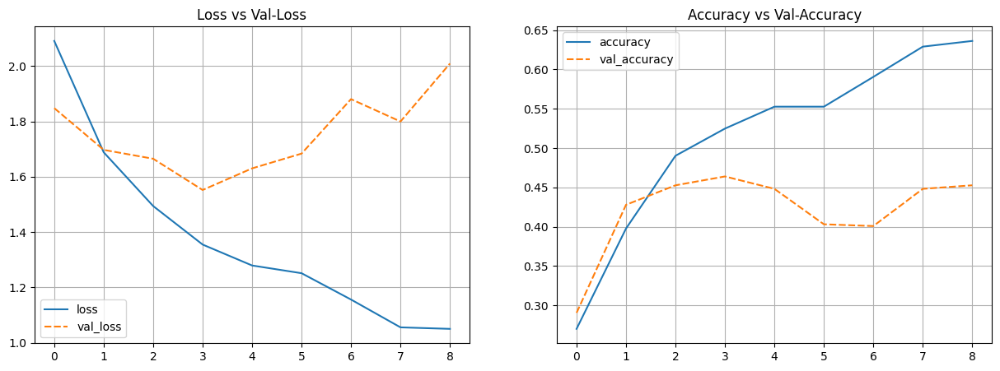

In [ ]:
# Plot training and validation accuracy and loss at each epoch
history_df = pd.DataFrame(history.history)

plt.figure(figsize=(15, 5))
plt.subplot(1, 2, 1)
sns.lineplot(data=history_df[['loss', 'val_loss']])
plt.title('Loss vs Val-Loss')
plt.grid(True)

plt.subplot(1, 2, 2)
sns.lineplot(data=history_df[['accuracy', 'val_accuracy']])
plt.title('Accuracy vs Val-Accuracy')
plt.grid(True)

plt.show()

In [ ]:
# Check the performance of test-set

## Get the probability
y_pred_prob = model.predict(test_set)

## Get class with maximum probability
y_pred_class = np.argmax(y_pred_prob, axis=-1)

## Display Classification Report
print(classification_report(test_set.classes, y_pred_class, target_names=(list(train_set.class_indices.keys()))))

4/4 [==============================] - 8s 2s/step
                            precision    recall  f1-score   support

         actinic keratosis       0.00      0.00      0.00        16
      basal cell carcinoma       0.29      0.62      0.40        16
            dermatofibroma       0.00      0.00      0.00        16
                  melanoma       0.18      0.12      0.15        16
                     nevus       0.48      0.62      0.54        16
pigmented benign keratosis       0.26      0.75      0.39        16
      seborrheic keratosis       0.00      0.00      0.00         3
   squamous cell carcinoma       0.00      0.00      0.00        16
           vascular lesion       0.67      0.67      0.67         3

                  accuracy                           0.31       118
                 macro avg       0.21      0.31      0.24       118
              weighted avg       0.18      0.31      0.22       118



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


##### - Akurasi : akurasi dari keseluruhan pada set pengujian adalah 31%. Hal ini menunjukkan kinerja yang kurang baik dan mengindikasikan bahwa model belum mampu mengeneralisasi dengan baik.
##### - Overfitting : model mengalami overfitting, hal ini dtunjukkan pada kinerja data train yang baik namun tidak pada data val dan test. Hal ini terlihat dari peningkatan yang signifikan pada taining accuracy tetapi tidak pada validation accurracy.
##### - Hasil ini menunjukkan bahwa augmentasi data sangat diperlukan untuk dapat meningkatkan variasi data train, sehingga model dapat belajarr lebih baik dan menghindari overfitting

## 4.2 Dengan Data Augmentation

#### -Preprocessing

In [ ]:
# Define hyperparameters

img_height= 150
img_width= 150
batch_size= 32

In [ ]:
# Create batch generator for train-set, val-set, and test-set with augmentation
from tensorflow.keras.preprocessing.image import ImageDataGenerator

train_datagen_aug = ImageDataGenerator(rescale=1./255,
                                       rotation_range=20,
                                       zoom_range=0.2,
                                       width_shift_range=0.2,
                                       height_shift_range=0.2,
                                       shear_range=0.2,
                                       horizontal_flip=True,
                                       validation_split=0.2)

train_set_aug = train_datagen_aug.flow_from_directory(train_path,
                                              target_size=(img_height,img_width),
                                              class_mode='categorical',
                                              subset='training',
                                              batch_size=batch_size,
                                              shuffle=True)

val_set_aug = train_datagen_aug.flow_from_directory(train_path,
                                            target_size=(img_height,img_width),
                                            class_mode='categorical',
                                            subset='validation',
                                            batch_size=batch_size,
                                            shuffle=True)

test_datagen = ImageDataGenerator(rescale=1./255)

test_set_aug = test_datagen.flow_from_directory(test_path,
                                            target_size=(img_height,img_width),
                                            class_mode='categorical',
                                            batch_size=batch_size,
                                            shuffle=False)

Found 1795 images belonging to 9 classes.
Found 444 images belonging to 9 classes.
Found 118 images belonging to 9 classes.


### -Model Definition



In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Conv2D, MaxPooling2D, Flatten, Dropout
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping

In [ ]:
# Clear session

tf.keras.backend.clear_session()
np.random.seed(20)
tf.random.set_seed(20)

In [ ]:
# Create Sequential API model
model_aug = Sequential()

model_aug.add(Conv2D(32, (3,3), activation='relu', input_shape=(img_height,img_width, 3)))
model_aug.add(MaxPooling2D(pool_size=(2,2)))

model_aug.add(Conv2D(64, (3,3), activation='relu'))
model_aug.add(MaxPooling2D(pool_size=(2,2)))

model_aug.add(Conv2D(128, (3,3), activation='relu'))
model_aug.add(MaxPooling2D(pool_size=(2,2)))

model_aug.add(Flatten())

model_aug.add(Dense(512, activation='relu'))
model_aug.add(Dropout(0,5))

model_aug.add(Dense(9, activation='softmax'))

model_aug.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

In [ ]:
model_aug.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 148, 148, 32)      896       
                                                                 
 max_pooling2d (MaxPooling2  (None, 74, 74, 32)        0         
 D)                                                              
                                                                 
 conv2d_1 (Conv2D)           (None, 72, 72, 64)        18496     
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 36, 36, 64)        0         
 g2D)                                                            
                                                                 
 conv2d_2 (Conv2D)           (None, 34, 34, 128)       73856     
                                                                 
 max_pooling2d_2 (MaxPoolin  (None, 17, 17, 128)       0

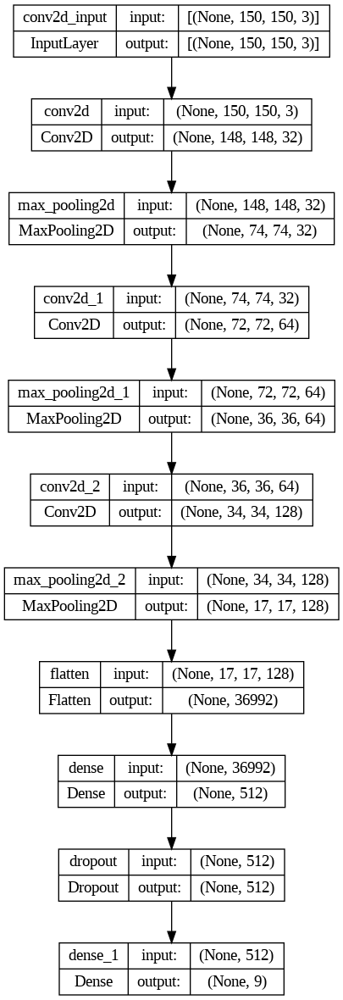

In [ ]:
# Plot layers

tf.keras.utils.plot_model(model_aug, show_shapes=True)

### -Model Training


In [ ]:
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

history_aug = model_aug.fit(
    train_set_aug,
    epochs=25,
    validation_data=val_set_aug,
    callbacks=[early_stopping]
)

Epoch 1/25
57/57 [==============================] - 148s 3s/step - loss: 2.0056 - accuracy: 0.2919 - val_loss: 1.7966 - val_accuracy: 0.2995
Epoch 2/25
57/57 [==============================] - 152s 3s/step - loss: 1.5649 - accuracy: 0.4440 - val_loss: 2.0207 - val_accuracy: 0.3919
Epoch 3/25
57/57 [==============================] - 146s 3s/step - loss: 1.5170 - accuracy: 0.4635 - val_loss: 1.8576 - val_accuracy: 0.4077
Epoch 4/25
57/57 [==============================] - 143s 3s/step - loss: 1.4122 - accuracy: 0.5008 - val_loss: 1.8949 - val_accuracy: 0.4212
Epoch 5/25
57/57 [==============================] - 145s 3s/step - loss: 1.3858 - accuracy: 0.5214 - val_loss: 1.6809 - val_accuracy: 0.4482
Epoch 6/25
57/57 [==============================] - 150s 3s/step - loss: 1.3351 - accuracy: 0.5387 - val_loss: 1.8160 - val_accuracy: 0.3874
Epoch 7/25
57/57 [==============================] - 155s 3s/step - loss: 1.3558 - accuracy: 0.5309 - val_loss: 1.8169 - val_accuracy: 0.4032
Epoch 8/25
57

### -Model Evaluation


In [ ]:
# Evaluate the model with test data
test_loss_aug, test_acc_aug = model.evaluate(test_set_aug)
print(f'Test Loss: {test_loss_aug}')
print(f'Test Accuracy: {test_acc_aug}')

4/4 [==============================] - 8s 2s/step - loss: 2.1880 - accuracy: 0.3051
Test Loss: 2.18802809715271
Test Accuracy: 0.3050847351551056


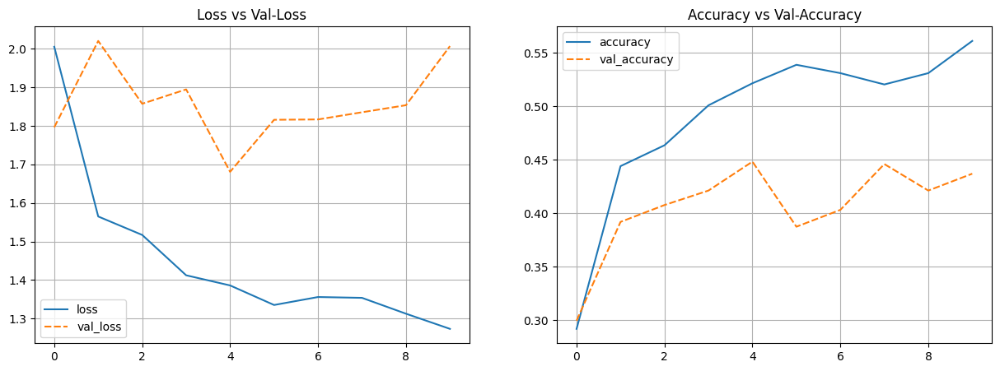

In [ ]:
# Plot training and validation accuracy and loss at each epoch
history_aug_df = pd.DataFrame(history_aug.history)

plt.figure(figsize=(15, 5))
plt.subplot(1, 2, 1)
sns.lineplot(data=history_aug_df[['loss', 'val_loss']])
plt.title('Loss vs Val-Loss')
plt.grid(True)

plt.subplot(1, 2, 2)
sns.lineplot(data=history_aug_df[['accuracy', 'val_accuracy']])
plt.title('Accuracy vs Val-Accuracy')
plt.grid(True)

plt.show()

In [ ]:
# Check the performance of test-set

## Get the probability
y_pred_prob_aug = model_aug.predict(test_set)

## Get class with maximum probability
y_pred_class_aug = np.argmax(y_pred_prob_aug, axis=-1)

## Display Classification Report
print(classification_report(test_set_aug.classes, y_pred_class_aug, target_names=(list(train_set_aug.class_indices.keys()))))

4/4 [==============================] - 6s 2s/step
                            precision    recall  f1-score   support

         actinic keratosis       0.00      0.00      0.00        16
      basal cell carcinoma       0.32      0.75      0.44        16
            dermatofibroma       0.00      0.00      0.00        16
                  melanoma       0.12      0.12      0.12        16
                     nevus       0.44      0.75      0.56        16
pigmented benign keratosis       0.42      0.81      0.55        16
      seborrheic keratosis       0.00      0.00      0.00         3
   squamous cell carcinoma       0.00      0.00      0.00        16
           vascular lesion       0.40      0.67      0.50         3

                  accuracy                           0.35       118
                 macro avg       0.19      0.34      0.24       118
              weighted avg       0.19      0.35      0.24       118



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


##### - Akurasi : akurasi dari keseluruhan pada set pengujian adalah 35%. Hal ini menunjukkan kinerja yang cukup kurang dan menunjukkan bahwa model tidak dapat mengklasifikasikan berbagai jenis lesi dengan baik.
##### - Overfitting : meskipun augmentasi data telah diterapkan untuk meningkatkan variasi data train, model tetap menunjukkan overfitting. Hal ini dapat dilihat dari peningkatan yang signifikan pada training accuracy tetapi tidak pada validation accuacy.
##### - Presisi, recall, dan F1-score yang sangat rendah menunjukkan bahwa model tidak dapat mengklasifikasikan banyak kelas dengan baik. Hal ini dapat disebabkan oleh ketidakseimbangan data.

# BAB VII. ANN IMPROVEMENT (SEQUENTIAL API/FUNCTIONAL API)

### -Preprocessing


In [ ]:
# Clear session

tf.keras.backend.clear_session()
np.random.seed(20)
tf.random.set_seed(20)

In [ ]:
# Define hyperparameters
img_height = 150
img_width = 150
batch_size = 32
num_classes = 9
learning_rate = 0.001

### -Model Definition


In [ ]:
from tensorflow.keras.models import Model, Sequential
from tensorflow.keras.layers import Dense, Dropout, Conv2D, MaxPooling2D, Flatten, Dropout, Input
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.applications import VGG16, ResNet50
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
from tensorflow.keras.metrics import Precision, Recall


In [ ]:
# Define model using sequential API with transfer learning (VGG16)
def create_vgg16_model(input_shape=(img_height, img_width, 3), num_classes=num_classes):
  base_model = VGG16(include_top=False, input_shape=input_shape, weights='imagenet')
  base_model.trainable = False

  model = Sequential([
      base_model,
      Flatten(),
      Dense(512, activation='relu'),
      Dropout(0.5),
      Dense(num_classes, activation='softmax')
  ])

  model.compile(optimizer=Adam(learning_rate=learning_rate),
                loss='categorical_crossentropy',
                metrics=['accuracy', Precision(), Recall()])
  return model

# Define model using functional API with tansfer learning (ResNet50)
def create_resnet50_model(input_shape=(img_height, img_width, 3), num_classes=num_classes):
  inputs = Input(shape=input_shape)
  base_model = ResNet50(include_top=False, input_tensor=inputs, weights='imagenet')
  base_model.trainable = False

  x = Flatten()(base_model.output)
  x = Dense(512, activation='relu')(x)
  x = Dropout(0.5)(x)
  outputs = Dense(num_classes, activation='softmax')(x)

  model = Model(inputs=inputs, outputs=outputs)

  model.compile(optimizer=Adam(learning_rate=learning_rate),
                loss='categorical_crossentropy',
                metrics=['accuracy', Precision(), Recall()])
  return model

vgg16_model = create_vgg16_model()
resnet50_model = create_resnet50_model()

# Summary
vgg16_model.summary()
resnet50_model.summary()

94765736/94765736 [==============================] - 1s 0us/step
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 vgg16 (Functional)          (None, 4, 4, 512)         14714688  
                                                                 
 flatten (Flatten)           (None, 8192)              0         
                                                                 
 dense (Dense)               (None, 512)               4194816   
                                                                 
 dropout (Dropout)           (None, 512)               0         
                                                                 
 dense_1 (Dense)             (None, 9)                 4617      
                                                                 
Total params: 18914121 (72.15 MB)
Trainable params: 4199433 (16.02 MB)
Non-trainable params: 14714688 (56.13 MB)
__________

### -Model Training


In [47]:
# Define callbacks
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=3, min_lr=0.0001)

# Training VGG16 model (Sequential API)
history_vgg16 = vgg16_model.fit(
    train_set,
    epochs=25,
    validation_data=val_set,
    callbacks=[early_stopping, reduce_lr])

# Training ResNet50 model (Functional API)
history_resnet50 = resnet50_model.fit(
    train_set,
    epochs=25,
    validation_data=val_set,
    callbacks=[early_stopping, reduce_lr])

Epoch 1/25
57/57 [==============================] - 675s 12s/step - loss: 1.1571 - accuracy: 0.6095 - precision: 0.8044 - recall: 0.3437 - val_loss: 1.5785 - val_accuracy: 0.4572 - val_precision: 0.5521 - val_recall: 0.2387 - lr: 2.0000e-04
Epoch 2/25
57/57 [==============================] - 630s 11s/step - loss: 1.1435 - accuracy: 0.6100 - precision: 0.8144 - recall: 0.3716 - val_loss: 1.5425 - val_accuracy: 0.4842 - val_precision: 0.5803 - val_recall: 0.2523 - lr: 2.0000e-04
Epoch 3/25
57/57 [==============================] - 622s 11s/step - loss: 1.1181 - accuracy: 0.6028 - precision: 0.8134 - recall: 0.3788 - val_loss: 1.5671 - val_accuracy: 0.4910 - val_precision: 0.5721 - val_recall: 0.2590 - lr: 2.0000e-04
Epoch 4/25
57/57 [==============================] - 624s 11s/step - loss: 1.1013 - accuracy: 0.6295 - precision: 0.8145 - recall: 0.3889 - val_loss: 1.6221 - val_accuracy: 0.4617 - val_precision: 0.5663 - val_recall: 0.2500 - lr: 2.0000e-04
Epoch 5/25
57/57 [==================

### -Model Evaluation


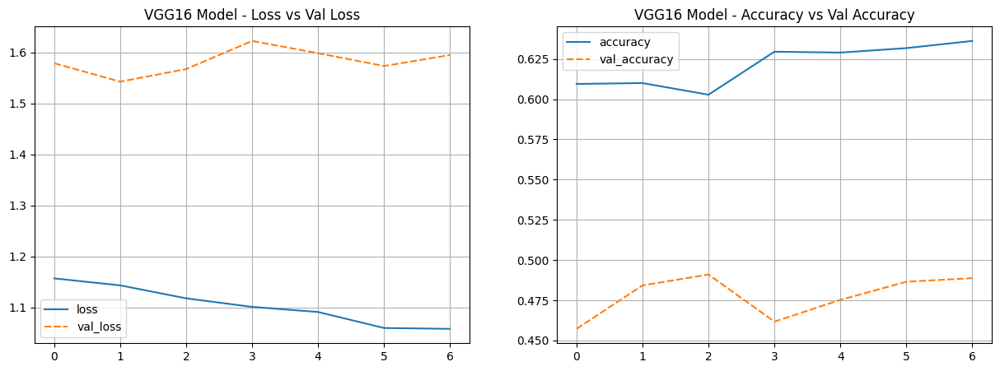

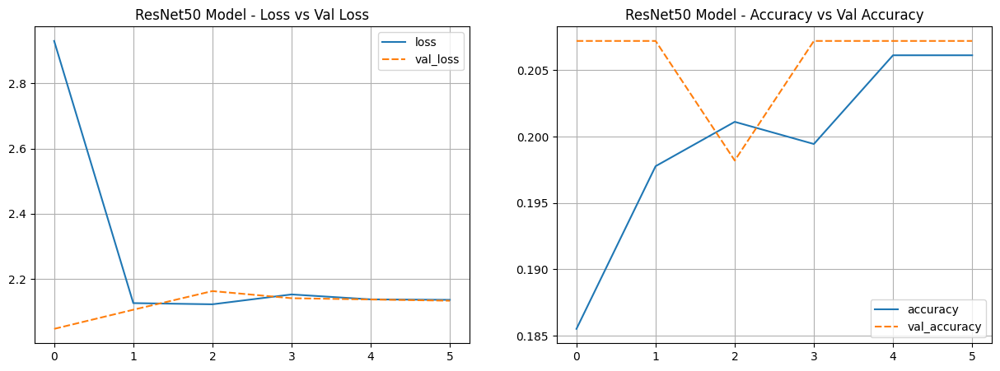

4/4 [==============================] - 38s 9s/step - loss: 1.7858 - accuracy: 0.4153 - precision: 0.5870 - recall: 0.2288
VGG16 Model - Test Loss: 1.7858494520187378
VGG16 Model - Test Accuracy: 0.41525423526763916
VGG16 Model - Test Precision: 0.5869565010070801
VGG16 Model - Test Recall: 0.2288135588169098
4/4 [==============================] - 36s 8s/step
                            precision    recall  f1-score   support

         actinic keratosis       1.00      0.06      0.12        16
      basal cell carcinoma       0.35      0.69      0.47        16
            dermatofibroma       1.00      0.06      0.12        16
                  melanoma       0.40      0.25      0.31        16
                     nevus       0.44      0.88      0.58        16
pigmented benign keratosis       0.34      0.75      0.47        16
      seborrheic keratosis       0.00      0.00      0.00         3
   squamous cell carcinoma       0.75      0.19      0.30        16
           vascular lesion

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


4/4 [==============================] - 16s 4s/step - loss: 2.1819 - accuracy: 0.1356 - precision_1: 0.0000e+00 - recall_1: 0.0000e+00
ResNet50 Model - Test Loss: 2.1818559169769287
ResNet50 Model - Test Accuracy: 0.1355932205915451
ResNet50 Model - Test Precision: 0.0
ResNet50 Model - Test Recall: 0.0
4/4 [==============================] - 18s 4s/step
                            precision    recall  f1-score   support

         actinic keratosis       0.00      0.00      0.00        16
      basal cell carcinoma       0.00      0.00      0.00        16
            dermatofibroma       0.00      0.00      0.00        16
                  melanoma       0.33      0.06      0.11        16
                     nevus       0.00      0.00      0.00        16
pigmented benign keratosis       0.13      0.94      0.23        16
      seborrheic keratosis       0.00      0.00      0.00         3
   squamous cell carcinoma       0.00      0.00      0.00        16
           vascular lesion       

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [49]:
def plot_history(history, title):
  hist_df = pd.DataFrame(history.history)

  plt.figure(figsize=(15,5))

  # Loss
  plt.subplot(1,2,1)
  sns.lineplot(data=hist_df[['loss', 'val_loss']])
  plt.title(f'{title} - Loss vs Val Loss')
  plt.grid(True)

  # Accuracy
  plt.subplot(1,2,2)
  sns.lineplot(data=hist_df[['accuracy', 'val_accuracy']])
  plt.title(f'{title} - Accuracy vs Val Accuracy')
  plt.grid(True)

  plt.show()

# Plot histories
plot_history(history_vgg16, 'VGG16 Model')
plot_history(history_resnet50, 'ResNet50 Model')

# Evaluate on test set
def evaluate_model(model, test_set, title):
  test_loss, test_acc, test_prec, test_recall = model.evaluate(test_set)
  print(f'{title} - Test Loss: {test_loss}')
  print(f'{title} - Test Accuracy: {test_acc}')
  print(f'{title} - Test Precision: {test_prec}')
  print(f'{title} - Test Recall: {test_recall}')

  y_pred_prob = model.predict(test_set)
  y_pred_class = np.argmax(y_pred_prob, axis=1)

  print(classification_report(test_set.classes, y_pred_class, target_names=list(test_set.class_indices.keys())))

# Evaluate model
evaluate_model(vgg16_model, test_set, 'VGG16 Model')
evaluate_model(resnet50_model, test_set, 'ResNet50 Model')


##### - Best Model : berdasarkan hasil evaluasi, model VGG16 menunjukkan performa yang lebih baik dibandingkan dengan model ResNet50 dalam hal test accuracy dan precision. Meskipun kedua model menunjukkan beberapa tanda overfitting, model VGG16 memiliki akurasi dan precision yang lebih tinggi

### -Fine Tuning VGG16 Implementation


In [66]:
from tensorflow.keras.regularizers import l2
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import pickle

# Clear session

tf.keras.backend.clear_session()
np.random.seed(20)
tf.random.set_seed(20)

# Define hyperparameters
img_height = 150
img_width = 150
num_classes = 9
learning_rate = 0.001

# Define fine_tuned VGG16 model with additional regularization

def create_fine_tuned_vgg16_model(input_shape=(img_height, img_width, 3), num_classes=num_classes):
  base_model = VGG16(include_top=False, input_shape=input_shape, weights='imagenet')
  for layer in base_model.layers[-4:]:
    layer.trainable = True

  model = Sequential([
      base_model,
      Flatten(),
      Dense(512, activation='relu', kernel_regularizer=l2(0.001)),
      Dropout(0.5),
      Dense(num_classes, activation='softmax')
  ])

  model.compile(optimizer=Adam(learning_rate=learning_rate / 10),
                loss='categorical_crossentropy',
                metrics=['accuracy', Precision(), Recall()])
  return model

# Define data augmentation
train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest'
)
val_datagen = ImageDataGenerator(rescale=1./255)
#data_augmentation = tf.keras.Sequential([
#    tf.keras.layers.RandomFlip('horizontal'),
#    tf.keras.layers.RandomRotation(0.2),
#    tf.keras.layers.RandomZoom(0.2),
#])

train_set_aug = train_datagen.flow_from_directory(
    train_path,
    target_size=(img_height, img_width),
    batch_size=32,
    class_mode='categorical'
)

val_set = val_datagen.flow_from_directory(
    train_path,
    target_size=(img_height, img_width),
    batch_size=32,
    class_mode='categorical'
)

#train_set_aug = train_set.map(lambda x, y: (data_augmentation(x, training=True), y))

fine_tuned_vgg16_model = create_fine_tuned_vgg16_model()

# Define callbacks
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=3, min_lr=0.0001)

# Training fine-tuned VGG16 model with data augmentation
history_fine_tuned_vgg16 = fine_tuned_vgg16_model.fit(
    train_set_aug,
    epochs=2,
    validation_data=val_set,
    callbacks=[early_stopping, reduce_lr]
)

# Save fine-tuned model and training history
fine_tuned_vgg16_model.save('fine_tuned_vgg16_model.h5')
with open('history_fine_tuned_vgg16.pkl','wb') as file:
  pickle.dump(history_fine_tuned_vgg16.history, file)



Found 2239 images belonging to 9 classes.
Found 2239 images belonging to 9 classes.
Epoch 1/2
70/70 [==============================] - 2879s 40s/step - loss: 2.7924 - accuracy: 0.2331 - precision: 0.3846 - recall: 0.0134 - val_loss: 2.2996 - val_accuracy: 0.3426 - val_precision: 0.6165 - val_recall: 0.1300 - lr: 1.0000e-04
Epoch 2/2
70/70 [==============================] - 2738s 39s/step - loss: 2.1588 - accuracy: 0.3506 - precision: 0.5593 - recall: 0.1117 - val_loss: 1.8711 - val_accuracy: 0.4471 - val_precision: 0.6654 - val_recall: 0.2291 - lr: 1.0000e-04


### -Fine Tuning VGG16 Evaluation


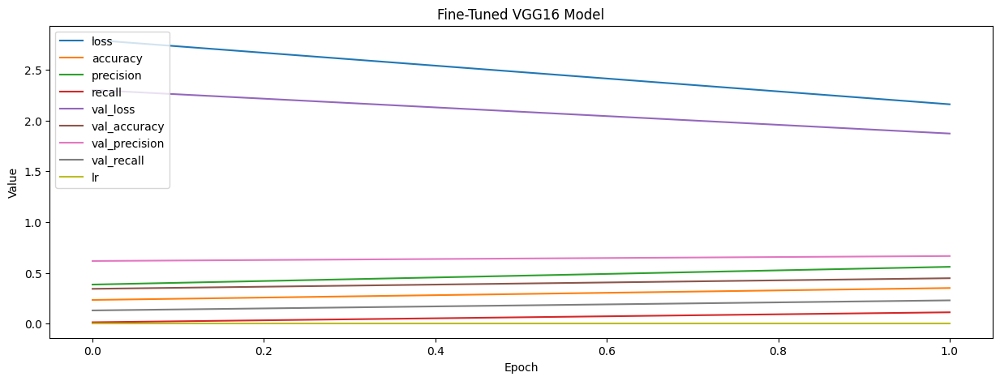

In [70]:
import pickle
import pandas as pd
import matplotlib.pyplot as plt

def plot_history(history, title):
  hist_df = pd.DataFrame(history)
  plt.figure(figsize=(15,5))
  plt.plot(hist_df)
  plt.title(title)
  plt.ylabel('Value')
  plt.xlabel('Epoch')
  plt.legend(hist_df.columns, loc='upper left')
  plt.show()

with open('history_fine_tuned_vgg16.pkl', 'rb') as file:
  history_fine_tuned_vgg16 = pickle.load(file)

plot_history(history_fine_tuned_vgg16, 'Fine-Tuned VGG16 Model')

##### - Secara keseluruhan, hasil penelitian dengan model Fine-Tuned VGG16 menunjukkan peningkatan perforrma yang cukup konsisten dengan stabilitas yang baik pada berbagai metrics. Model ini tampaknya cukup efektif dalam mengidentifikasi dan mengklasifikasi data dengan performa cuukp baik pada data train dan validation.

# BAB VIII. MODEL SAVING

In [64]:
from tensorflow.keras.models import load_model
# Model fine_tuned_vgg16_model sudah di saving pada BAB ANN Improvement sub bab  Fine Tuning VGG16 Implementation
#  fine_tuned_vgg16_model.save('fine_tuned_vgg16_model.h5')
#  with open('history_fine_tuned_vgg16.pkl','wb') as file:
#  pickle.dump(history_fine_tuned_vgg16.history, file)

# Load VGG16 model pre-trained on ImageNet
vgg16_model = VGG16(weights='imagenet')
# Save VGG16 model
vgg16_model.save('vgg16_pretrained.h5')

553467096/553467096 [==============================] - 7s 0us/step


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


# BAB IX. MODEL INFERENCE

- Untuk model inference dijalankan pada notebook berbeda dengan nama file P2G7_ranie_sita_inference.ipynb

# BAB X. CONCLUSION

### 1. Narasi berdasarkan EDA : Berdasarkan visualisasi distribusi kelas data, diketahui bahwa kelas 'melanoma' dan 'pigmented benign kerastosis' memiliki jumlah gambar terbanyak, masing-masing lebih dari 400 gambar.Dari visualisasi gambar per kelas menunjukkan variasi yang signifikan pada karakteristik visual lesi kulit, yang menunjukkan tantangan dalam mengklasifikasikan gambar-gambar ini dengan benar. Augmentasi data dilakukan untuk memperkaya set pada train dan mengurangi kemungkinan overfitting.
### 2. Narasi berdasarrkan Model Evaluasi : Dua model pre-trained yang diimplementasikan adalah VGG16 dan ResNet50, yang di-tune untuk klasifikasi gambar lesi kulit. Model VGG16 menunjukkan kinerja yang lebih baik dibandingkan dengan ResNet50. Evaluasi model menunjukkan bahwa VGG16 mencapai akurasi tes sebesar XX, precision XX, dan recall sebesar XX. Hal ini menunjukkan bawa model VGG16 lebih baik untuk dapat mengenali kelas setelah proses fine-tuning dibandingkan ResNet50.
### 3. Narasi berdasarkan Model Analisis : Analisis model menunjukkan bahwa VGG16 mampu menangkap lebih banyak fitur relevan dari gambar lesi kulit dibandingkan dengan ResNet50. Tren akurasi dan loss selama pelatihan dan validasi menunjukkan bahwa VGG16 memiliki kemampuan genralisasi yang lebih baik pada dataset validasi dibandingkan dengan ResNet50. Meskipn demikian, masih ada ruang untuk dapat dilakukuan peningkatan lebih lanjut dalam hal peningkatan akurasi dan kemampuan generalisasi model.
### 4. Futher Improvement : Untuk meningkatkan performa model, terdapat beberapa hal yang dapat dilakukan diantaranya adalah menerapkan teknink augmentasi data tambahan seperti pengaturan brightness, contrast, dan pembalikan vertikal untuk lebih memperkaya set dari data train. Kemudian dilakukan penerapan fine-tuning pada lebih banyak layer dalam model pre-trained untuk memungkinkan model belajar fitur spesifik dari dataset ini. Serta dapat dilakukan dengan mencoba model lain sepeerti EfficientNet atau DenseNet yang mungkin memberikan hasil lebih baik pada model.
### 5. Hal lain : Model ini dapat memberikan penilaian objektif yang dapat membantu dokter kulit dalam mendiagnosis lesi kulit. Dengan memberikan informasi tambahan berdasarkan analisis gambar, model ini dapat meningkatkan akurasi diagnosis dan mengurangi human error. Model ini bisa diterapkan dalam layanan telemedicine, memungkinkan pasien pada daerah terpencil untuk mendapatkan diagnosis awal darri foto lesi kulit yang dikirimkan. Hal ini dapat meningkatkan aksesibilitas layanan kesehatan. Serta model dapat digunakan sebagai alat bantu dalam pelatihan dokter dan tenaga medis lainnya, memberikan contoh nyata dari berbagai jenis lesi kulit dan bagaimana mereka diklasifikasikan oleh model.